<a href="https://colab.research.google.com/github/asagar60/Neural-Style-Transfer/blob/master/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Style Transfer Implementation

## Loading Prerequisites

In [0]:
import tensorflow as tf
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [0]:
from tensorflow.keras.preprocessing.image import save_img,img_to_array
from tensorflow.keras.models import Model
from tqdm.notebook import tqdm

## Selecting Model
1. Load VGG19 Model for Transfer Learning
2. Freeze selected Layers 
3. Save layer details

In [0]:
feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
content_layers = ['block5_conv2']



In [0]:
def get_model():
  
  vgg19 =  tf.keras.applications.vgg19.VGG19(include_top = False, weights = 'imagenet')
  vgg19.trainable = False

  style_output = []
  content_output = []

  for layer_name in feature_layers:
    style_output.append(vgg19.get_layer(layer_name).output)

  for layer_name in content_layers:
    content_output.append(vgg19.get_layer(layer_name).output)

  model_output = style_output + content_output

  model =Model(vgg19.input, model_output)
  return model

In [5]:
vgg_model = get_model()
print(vgg_model.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

## Load and Visualize Images

In [0]:
from google.colab import files

In [0]:
#upload = files.upload()

In [0]:
def load_image(image_path, display = False, max_height = 500, max_width = 400):
  img = Image.open(image_path)
  if display:
    print('Image Before resizing')
    plt.figure(figsize = (20,10))

    plt.subplot(1,1,1)
    plt.imshow(img)
    plt.title('Image')

  img =img.resize((max_width, max_height), Image.ANTIALIAS)
  img = img_to_array(img)
  img = np.expand_dims(img, axis = 0)
  return img

Image Before resizing
Image Before resizing
Image Before resizing
Image Before resizing
Image Before resizing
Image Before resizing
Image Before resizing
Image Before resizing
Image Before resizing


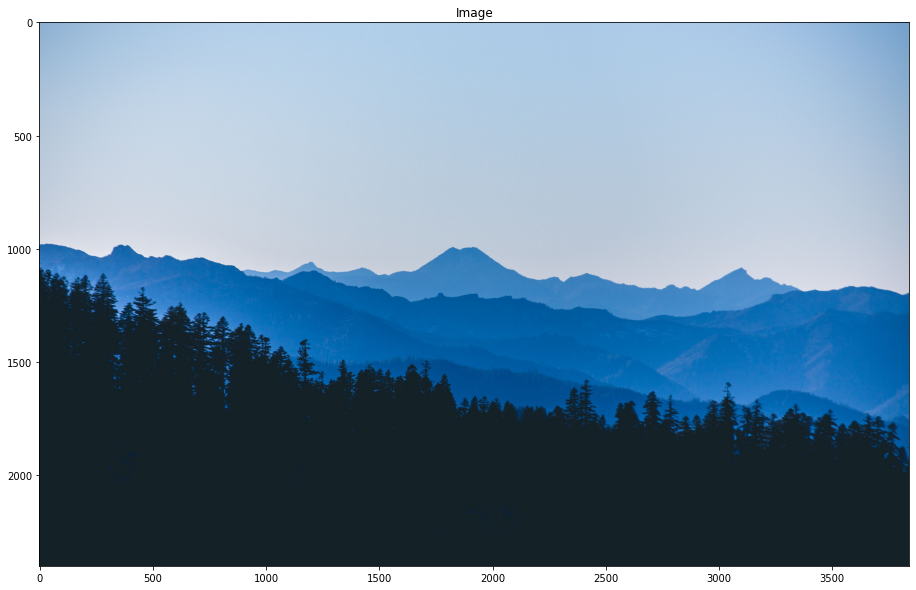

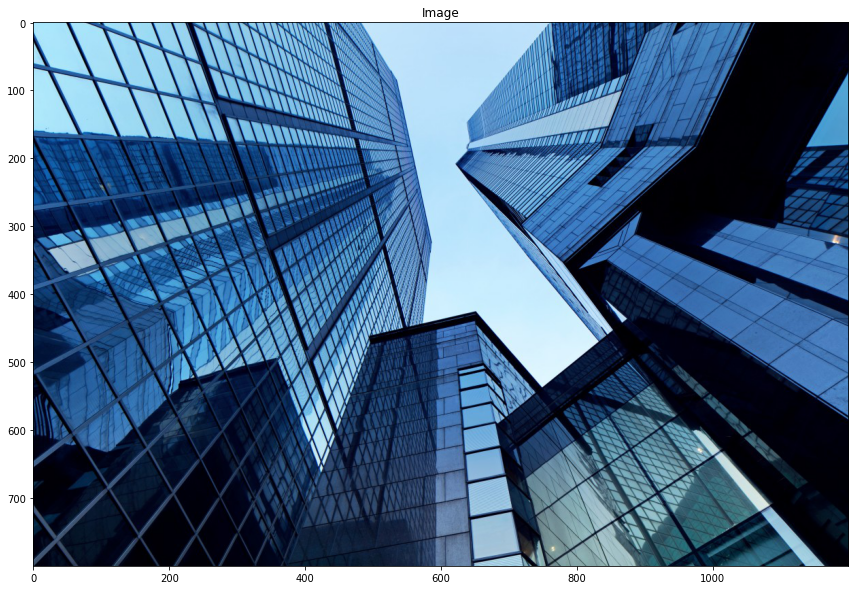

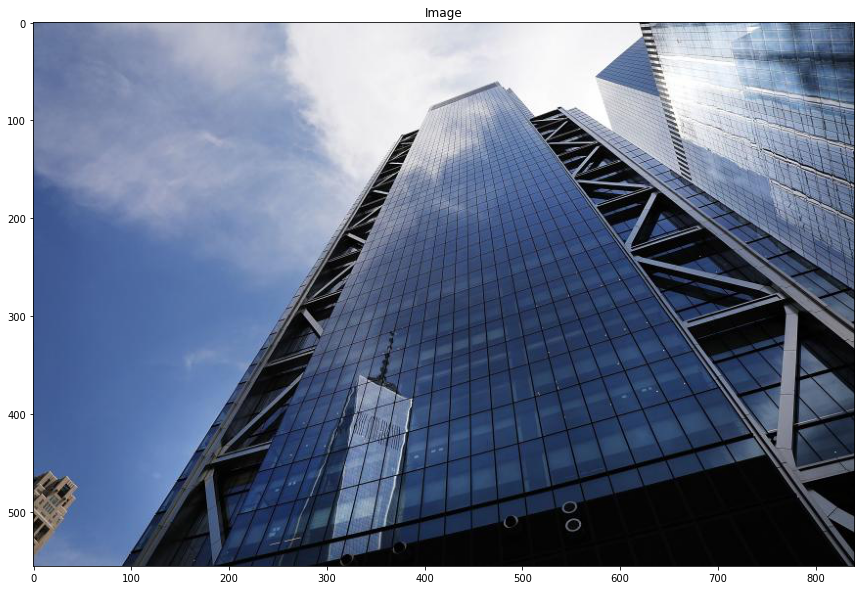

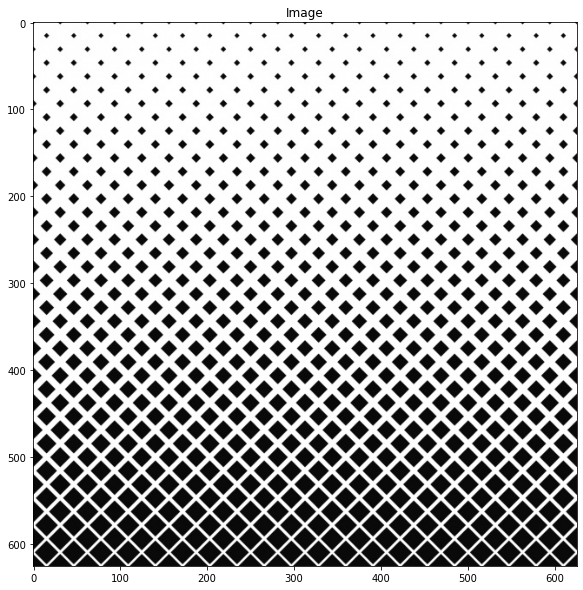

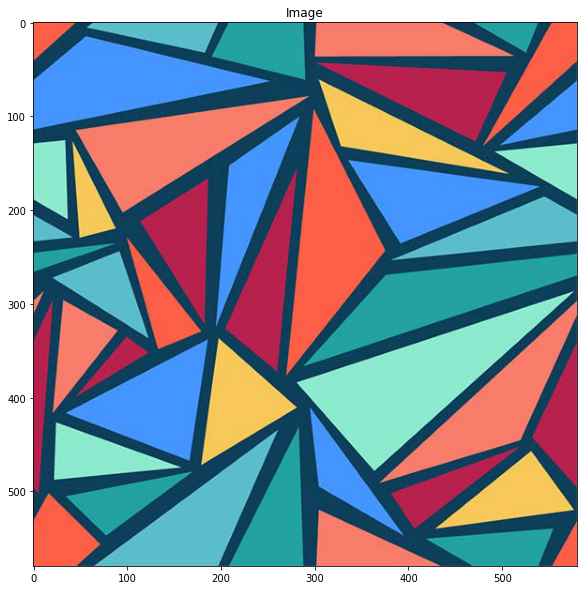

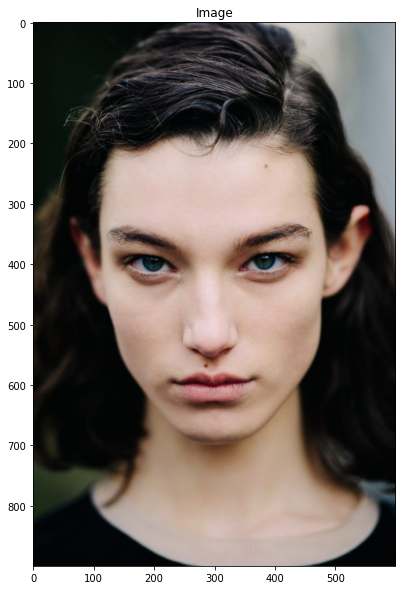

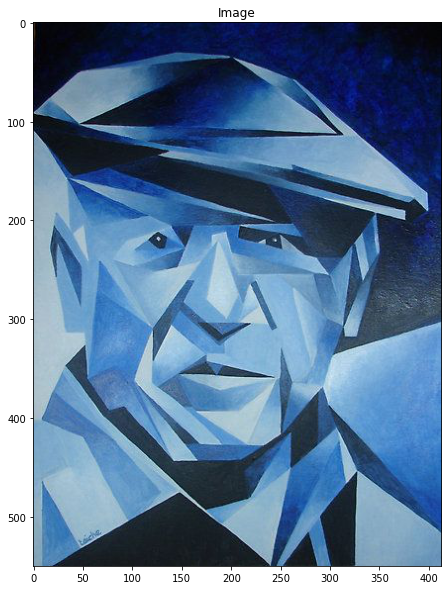

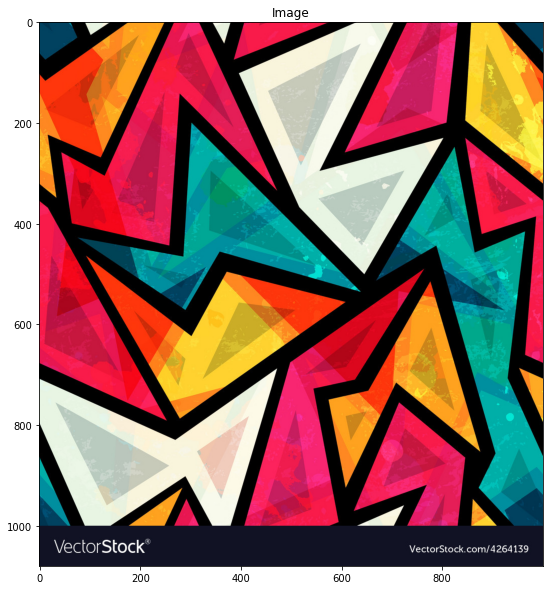

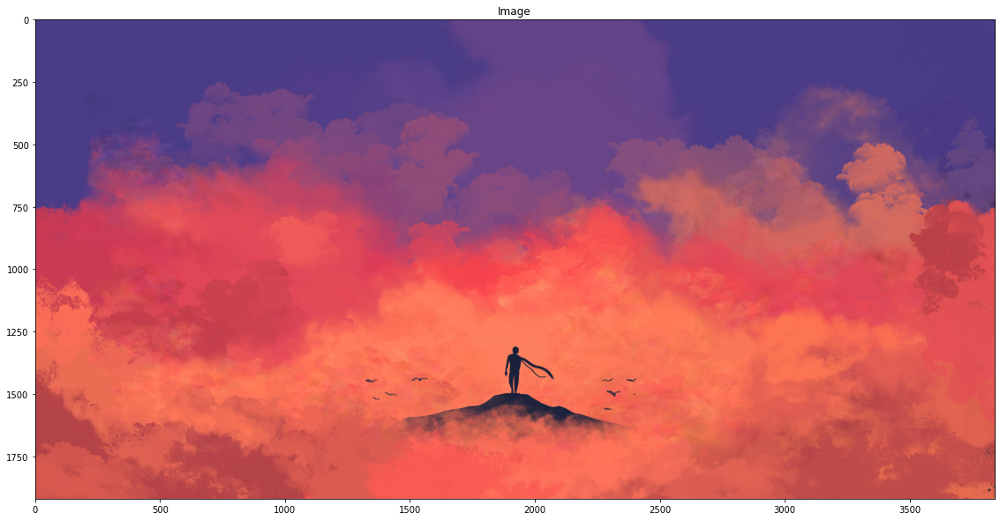

In [9]:
for imgs in os.listdir('.'):
  if os.path.isfile(imgs):
    _ = load_image(imgs, display = True)

In [0]:
content_image_path = 'face.jpg'
style_image_path = 'abstract_square.jpg'


In [0]:
def vgg_preprocessing(img_path):
  img = load_image(img_path)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

In [0]:
def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x,0)
    assert len(x.shape) == 3 , ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
    
  if len(x.shape)!=3:
    raise ValueError("Invalid input to deprocessing image")
        
  x[:,:,0] += 103.939
  x[:,:,1] += 116.779
  x[:,:,2] += 123.68
    
  x = x[:,:,::-1] # what it does ?
    
  x = np.clip(x, 0, 255).astype('uint8')
  return x

Image Before resizing


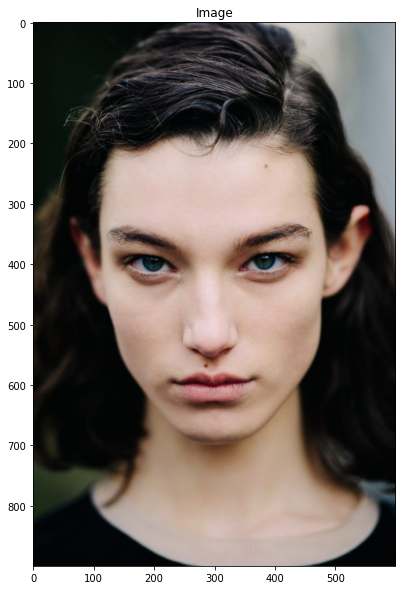

In [13]:
content_image = load_image(content_image_path, True)

Image Before resizing


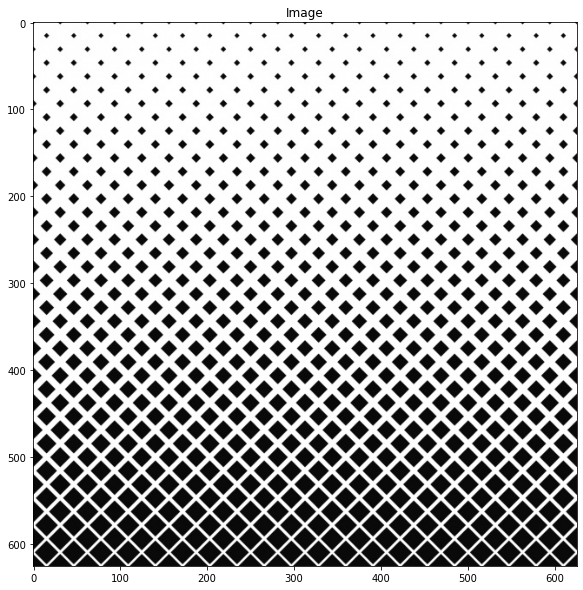

In [14]:
style_image = load_image(style_image_path, True)

In [15]:
print(content_image.shape)
print(style_image.shape)

(1, 500, 400, 3)
(1, 500, 400, 3)


## Defining Cost Functions
1. Define Content Image cost
2. Define Gram Matrix
3. Define Style Cost
4. Define Overall Cost


In [0]:
def content_cost(base_content, target):
  return tf.reduce_mean(tf.square(base_content-target))

def gram_matrix(a):
  channels = int(a.shape[-1])
  a = tf.reshape(a, shape = [-1,channels])
  gram = tf.matmul(a,a, transpose_a=True)
  return gram

def style_cost(base_style, target):
  
  h, w, c  =  target.get_shape().as_list()
  target_gram = gram_matrix(target)

  cost = tf.reduce_sum(tf.square(base_style - target_gram))/ ((2*h*w*c)**2)
  return cost

def compute_loss(model, alpha, beta, generated_image, base_style_features, base_content_features):
  """
  alpha = hyperparamter for content_loss
  beta = hyperparamter for style_loss
  """
  generated_activations = model(generated_image)
  style_activations = generated_activations[:len(feature_layers)]
  content_activations = generated_activations[len(feature_layers):]

  style_score = 0
  content_score = 0

  style_layers_weights = 1.0/float(len(feature_layers))
  for base_style, target_style in zip(base_style_features, style_activations):
    style_score += style_layers_weights * style_cost(base_style, target_style[0])
  
  for base_content, target_content in zip(base_content_features, content_activations):
    content_score += content_cost(base_content, target_content)

  total_cost = alpha * content_score + beta * style_score

  return total_cost

## Get activations of both content and Style Image 

In [0]:
def get_activations(model, content_image_path, style_image_path):
  content_img = load_image(content_image_path)
  style_img = load_image(style_image_path)

  style_output = model(style_img)
  content_output = model(content_img)

  style_activations = [layer[0] for layer in style_output[:len(feature_layers)]]
  content_activations =[layer[0] for layer in content_output[len(feature_layers):]]

  return style_activations, content_activations

## Training

In [0]:
#@tf.function
def run_nst(content_image_path, style_image_path, num_iter = 1000, alpha = 100, beta =10):
  model = get_model()
  for layer in model.layers:
    layer.trainable = False

  style_features, content_features = get_activations(model, content_image_path, style_image_path)
  style_gram = [gram_matrix(feature) for feature in style_features]

  generated_image = vgg_preprocessing(content_image_path)
  generated_image = tf.Variable(generated_image, dtype= tf.float32)

  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means

  best_loss = float('inf')
  best_img = None
  imgs_at_intervals = []
  optimizer = tf.keras.optimizers.Adam(learning_rate = 1, beta_1 = 0.99, epsilon= 0.1)
  #varlist = [generated_image]
  for i in tqdm(range(num_iter)):
    #print("Iteration : {}".format(i))
    with tf.GradientTape() as tape:
      loss = compute_loss(model, alpha, beta, generated_image, style_gram, content_features)
      #print('loss computed')
    grads = tape.gradient(loss, generated_image)
    #print('grad computed')
    optimizer.apply_gradients([(grads, generated_image)])
    clipped = tf.clip_by_value(generated_image, min_vals, max_vals)
    generated_image.assign(clipped)
    if loss < best_loss:
      best_loss = loss
      best_img = generated_image
      if i % 50 == 0:
        imgs_at_intervals.append(generated_image)
    #print('gradients applied')

  return best_img, imgs_at_intervals,generated_image

In [0]:
def display_imgs(imgs_at_intervals):
  total = len(imgs_at_intervals)
  plt.figure(figsize = (80,100))
  for i in range(1,total+1):
    plt.subplot(total+1,1,i)
    plt.imshow(deprocess_img(imgs_at_intervals[i-1].numpy()))

In [0]:
#display_imgs(imgs_at_intervals)

## Example 1

Image Before resizing


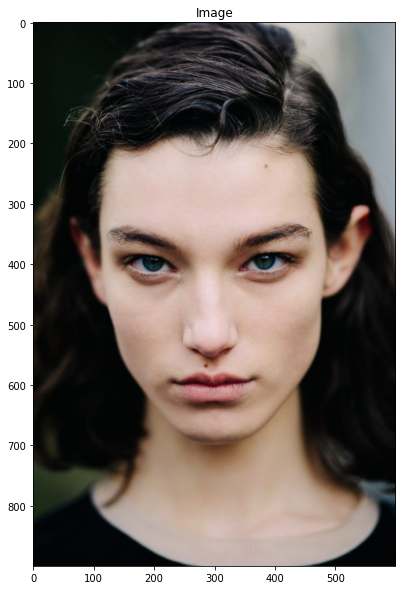

In [73]:
content_image_path = 'face.jpg'
style_image_path = 'geometric.jpg'
_ = load_image(content_image_path, True)

Image Before resizing


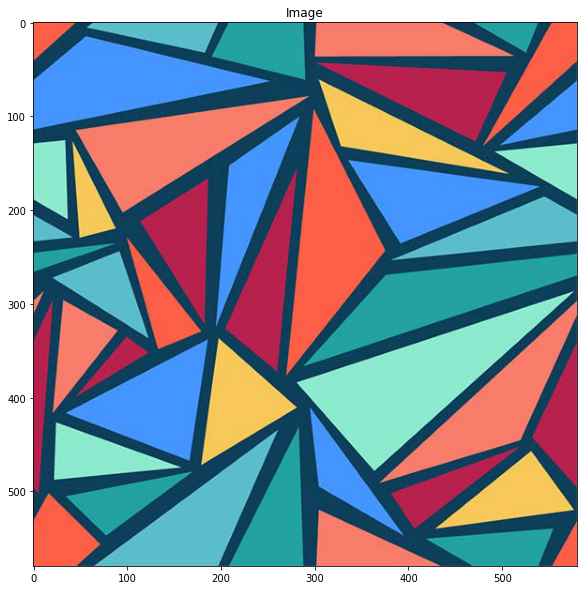

In [74]:
_ = load_image(style_image_path, True)

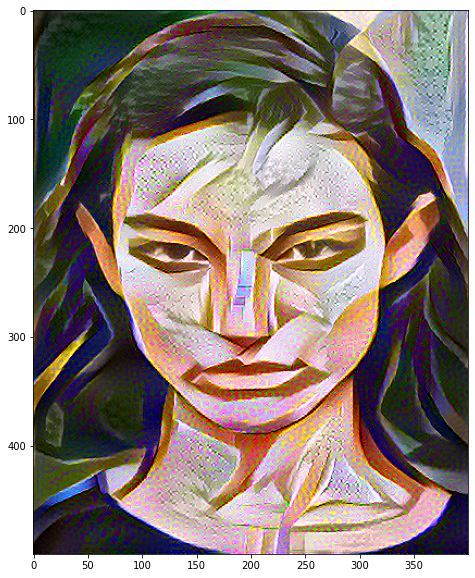

In [77]:
best_img, imgs_at_intervals, generated_image = run_nst(content_image_path, style_image_path)
plt.figure(figsize = (10,10))
deprocessed_image = deprocess_img(generated_image.numpy())
plt.imshow(deprocessed_image)

## Example 2

In [0]:
content_image_path = 'ss_2.jpg'
style_image_path = 'geometric.jpg'

Image Before resizing


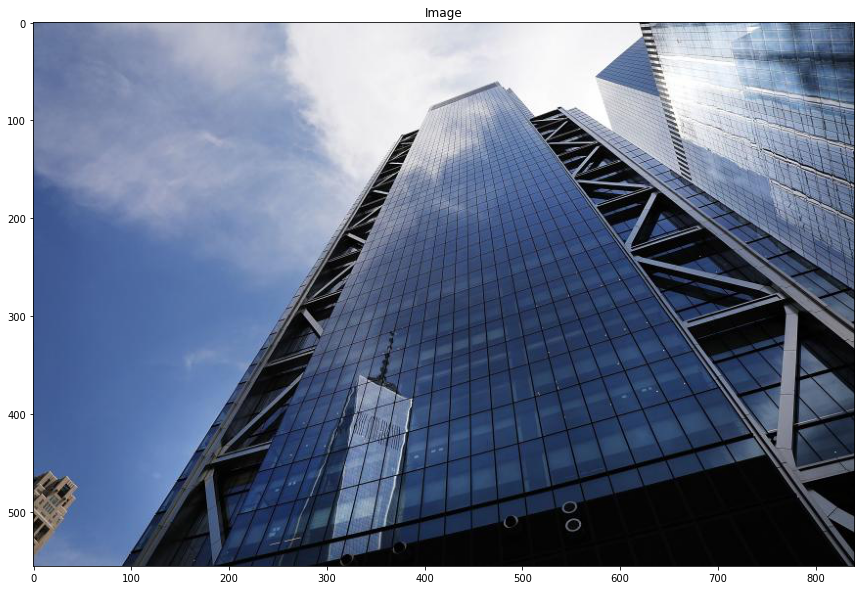

In [49]:
_ =load_image(content_image_path, True)

Image Before resizing


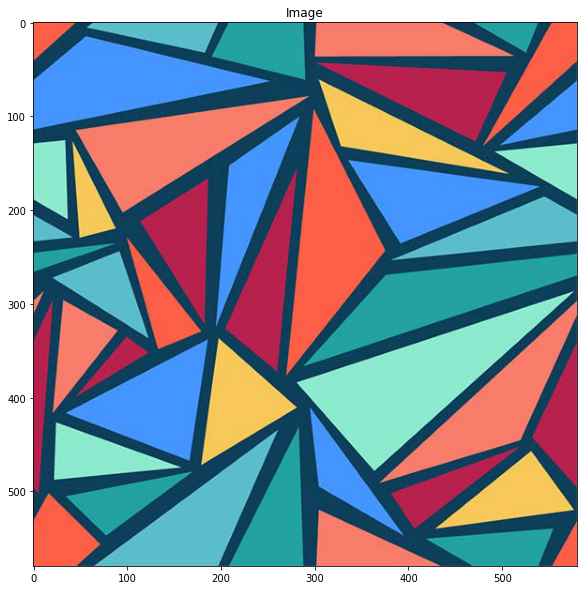

In [50]:
_ =load_image(style_image_path, True)

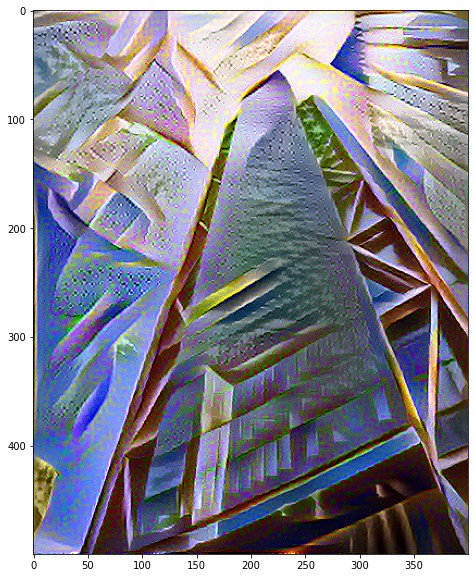

In [51]:
best_img, imgs_at_intervals, generated_image = run_nst(content_image_path, style_image_path)
plt.figure(figsize = (10,10))
deprocessed_image = deprocess_img(generated_image.numpy())
plt.imshow(deprocessed_image)

## Example 3

In [0]:
content_image_path = 'face.jpg'
style_image_path = 'blueperiod.jpg'


Image Before resizing


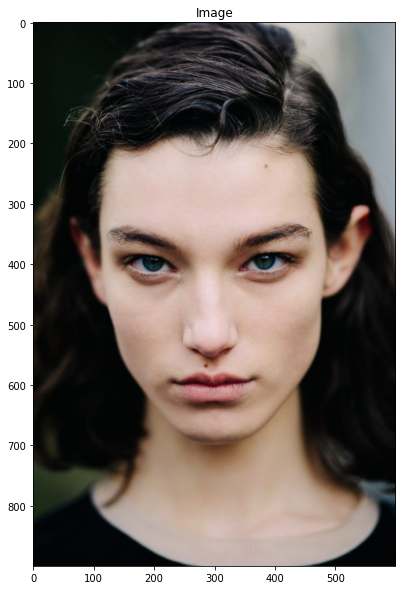

In [53]:
_ =load_image(content_image_path, True)

Image Before resizing


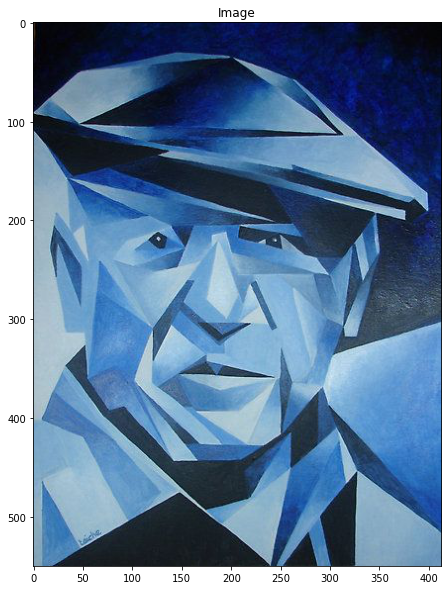

In [54]:
_ =load_image(style_image_path, True)

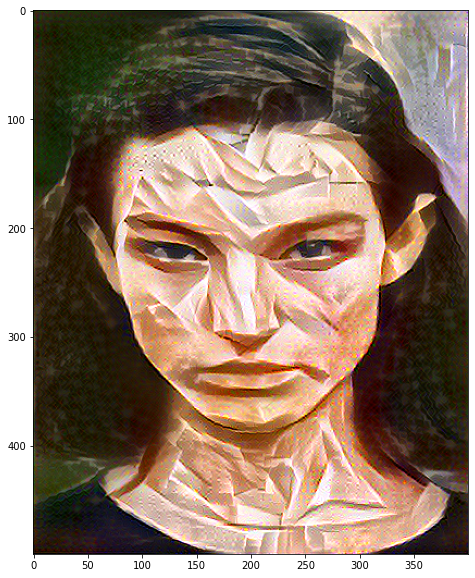

In [55]:
best_img, imgs_at_intervals, generated_image = run_nst(content_image_path, style_image_path)
plt.figure(figsize = (10,10))
deprocessed_image = deprocess_img(generated_image.numpy())
plt.imshow(deprocessed_image)

## Example 4

In [0]:
content_image_path = 'ss_2.jpg'
style_image_path = 'geometric_2.jpg'


Image Before resizing


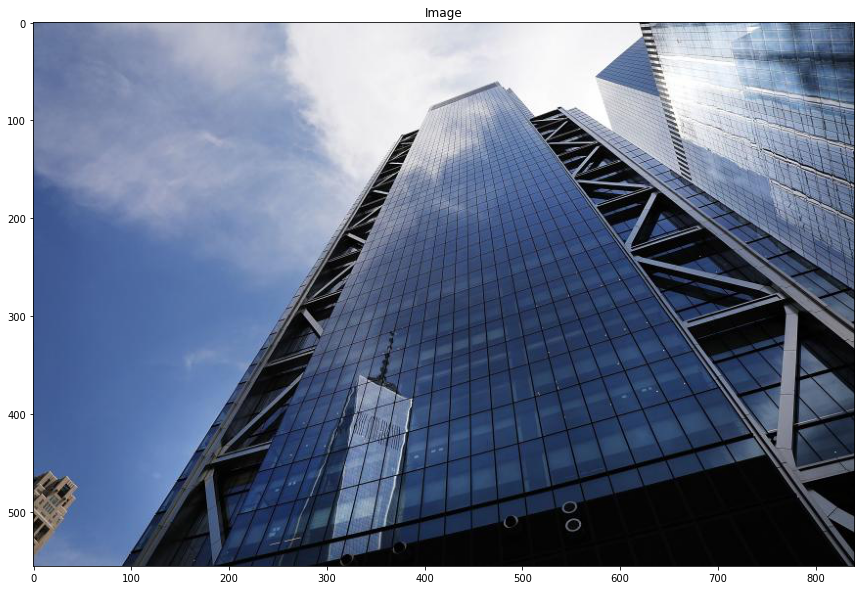

In [57]:
_ =load_image(content_image_path, True)

Image Before resizing


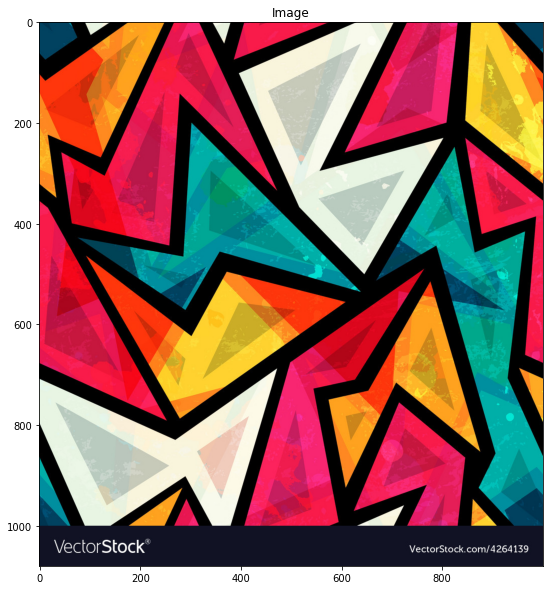

In [58]:
_ =load_image(style_image_path, True)

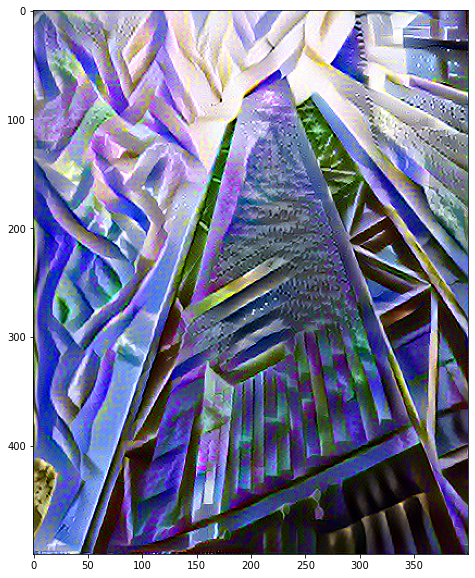

In [59]:
best_img, imgs_at_intervals, generated_image = run_nst(content_image_path, style_image_path)
plt.figure(figsize = (10,10))
deprocessed_image = deprocess_img(generated_image.numpy())
plt.imshow(deprocessed_image)

## Example 5

In [0]:
content_image_path = 'ss.jpg'
style_image_path = 'geometric_2.jpg'


Image Before resizing


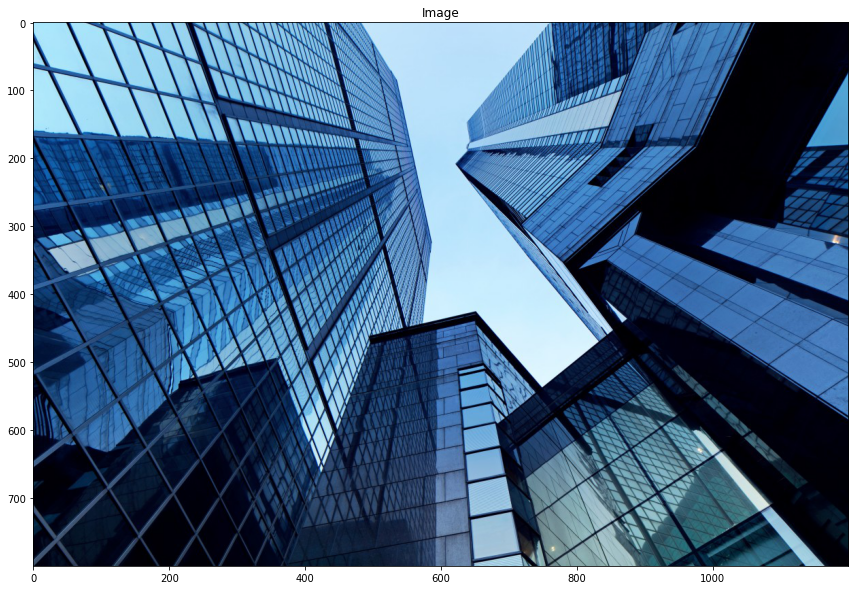

In [61]:
_ =load_image(content_image_path, True)

Image Before resizing


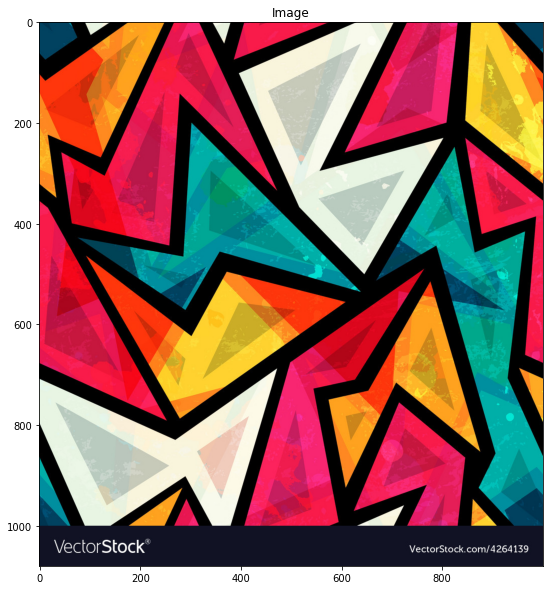

In [62]:
_ =load_image(style_image_path, True)

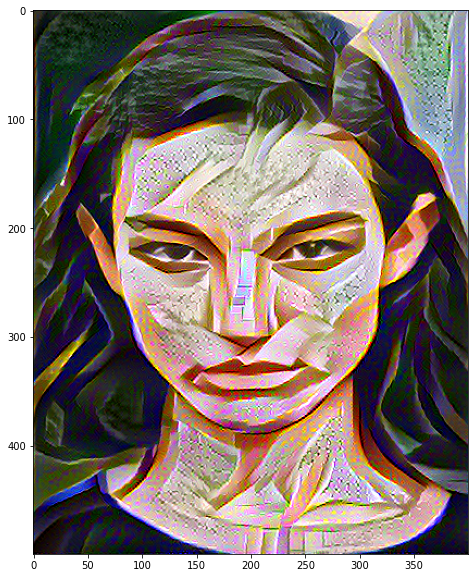

In [79]:
best_img, imgs_at_intervals, generated_image = run_nst(content_image_path, style_image_path)
plt.figure(figsize = (10,10))
deprocessed_image = deprocess_img(generated_image.numpy())
plt.imshow(deprocessed_image)

## Example 6

In [84]:
upload = files.upload()

Saving smoke.jpg to smoke.jpg
Saving bruce_lee.jpg to bruce_lee.jpg


In [0]:
content_image_path = 'bruce_lee.jpg'
style_image_path = 'smoke.jpg'

Image Before resizing


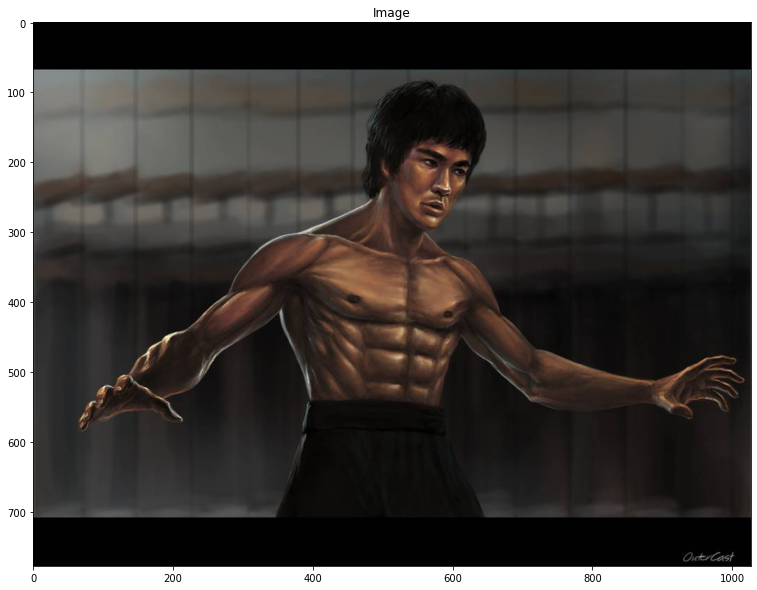

In [90]:
_ =load_image(content_image_path, True)

Image Before resizing


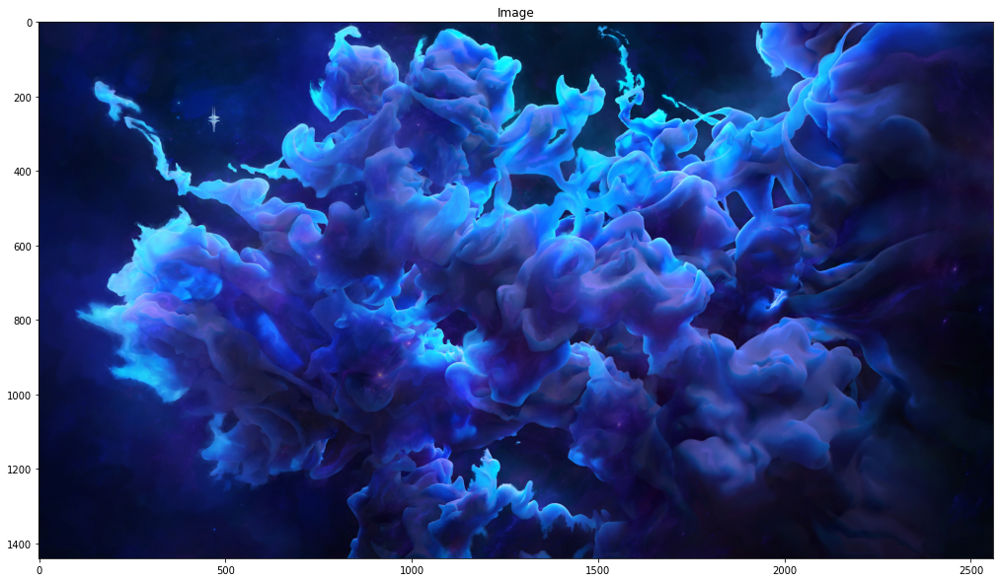

In [91]:
_ =load_image(style_image_path, True)

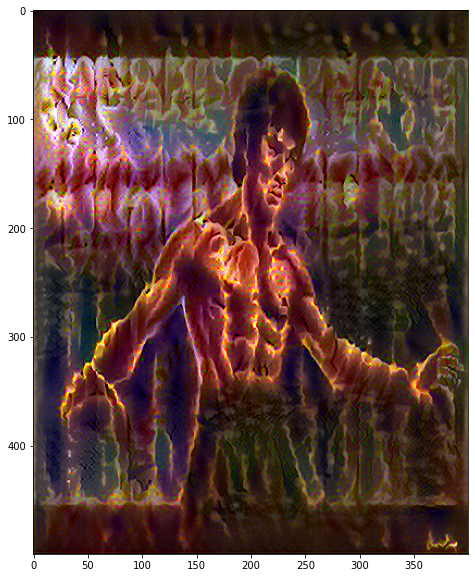

In [92]:
best_img, imgs_at_intervals, generated_image = run_nst(content_image_path, style_image_path)
plt.figure(figsize = (10,10))
deprocessed_image = deprocess_img(generated_image.numpy())
plt.imshow(deprocessed_image)